In [1]:
import gudhi
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.offline import iplot
import plotly.express as px
from tda_utils import *
#import sage

# Simplicial Complexes

**Definition:** Let $n \geq 0$ be an integer and $[v_n] ∶= \{v_0,v_1, \ldots ,v_n \}$ a collection of $n + 1$ symbols. An (abstract) simplicial complex $K$ on $[v_n]$ or a complex is a collection of subsets of $[v_n]$, excluding $\emptyset$, such that
1. if $\sigma \in K$ and $\tau \subset\sigma$,then $\tau \in K$
2. $\{ v_i \} \in K$ for every $v_i \in [v_n]$.
The set $[v_n]$ is called the vertex set of $K$ and the elements $\{ v_i \}$ are called vertices or 0-simplices. 

**Example:** Let $n = 5$ and $V(K) := \{ v_0, \ldots, v_5 \}$. Define

$$K := \{ \{v_0\}, \{ v_1 \}, \{v_2\}, \{v_3\}, \{v_4\}, \{v_5\}, \{v_1, v_2\}, \{v_1, v_4\}, \{v_2, v_3\},\{v_1, v_3\}, \{v_3, v_4\}, \{v_3, v_5\}, \{v_4, v_5\}, \{v_3, v_4, v_5\} \}$$

Then it can be visualized as: 

![Example Simplicial Complex](images/simplicial_complex_1.png "Example Simplicial Complex")



**Exercise:** Let $K$ be a simplicial complex on 5 vertices given by

![Example Simplicial Complex](images/simplicial_complex_2.png "Exercise Simplicial Complex")
    
Write down the sets given by $K$.

*Write Sets Here*

### Instantiating Complexes

In [79]:
X = SimplicialComplex([[0,1], [1,2], [0,2]])
#X = SimplicialComplex([[0,1,2]])

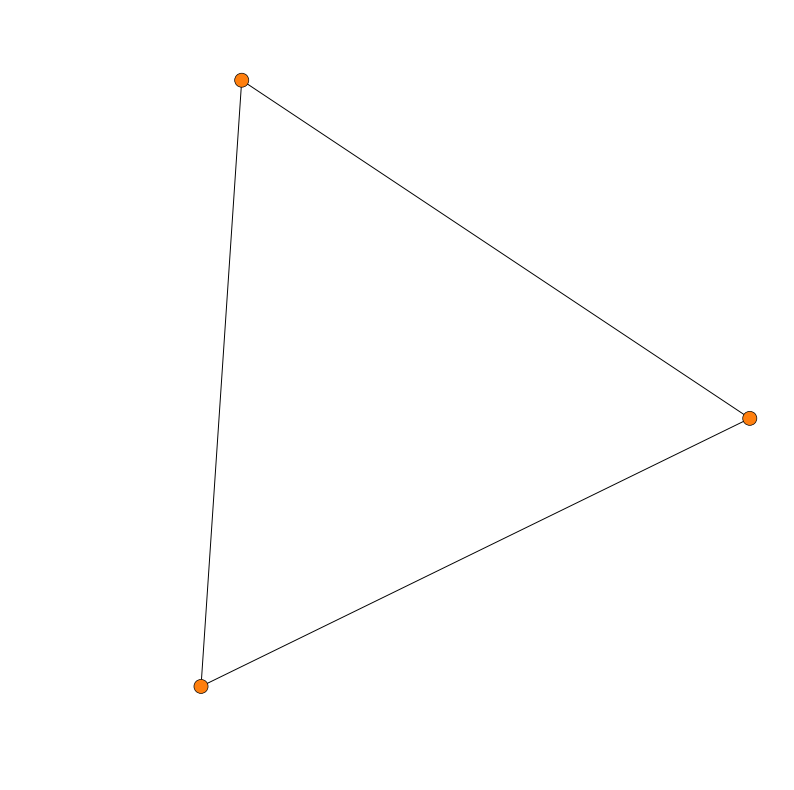

In [80]:
plt.figure(figsize=(10,10))
ax = plt.subplot(111)
draw_2d_simplicial_complex(X, ax=ax)

**Definition:** A set $\sigma$ of cardinality $d + 1$ is called a $d$-**dimensional simplex**

**Definition:** The **dimension** of a simplicial complex $K$ is the maximum of the dimensional of all of its simplices. 

**Definition:** The $f$-**vector** of $K$ is the vector 
$$c_K := (f_0, f_1, \ldots, f_{dim(K)})$$
where $f_i$ is the number of simplices of $K$ of dimension $i$, for $0 \leq i \leq dim(K)$

In [4]:
X.f_vector()[1:]

[3, 3]

### Useful Operations for Constructing More Sophisticated Complexes

In [6]:
XX = X.product(X)

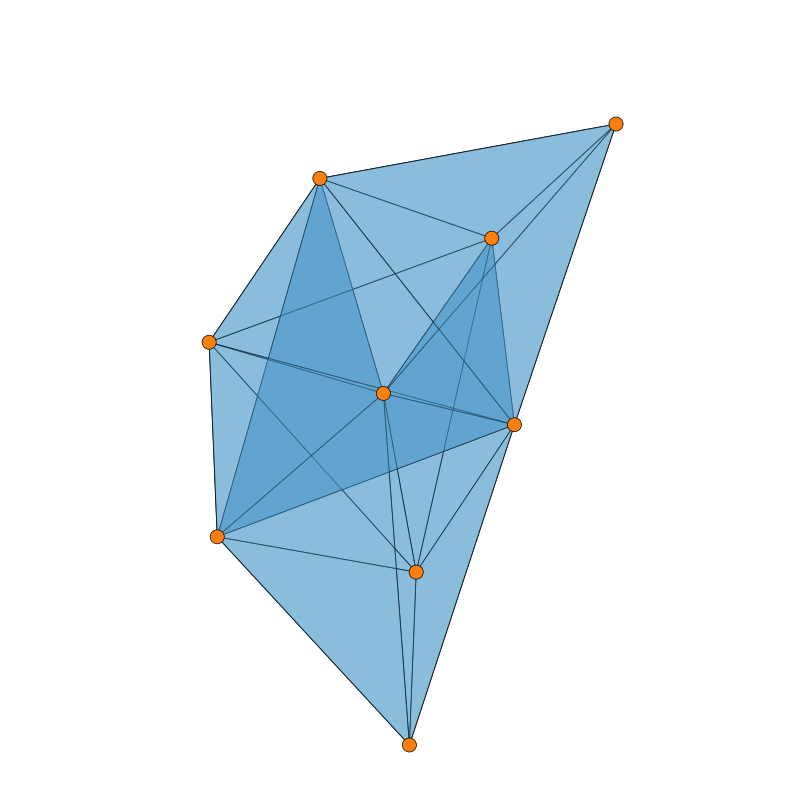

In [7]:
plt.figure(figsize=(10,10))
ax = plt.subplot(111)
draw_2d_simplicial_complex(XX, ax=ax)

In [8]:
XX.f_vector()[1:]

[9, 27, 18]

In [9]:
cX = X.cone()

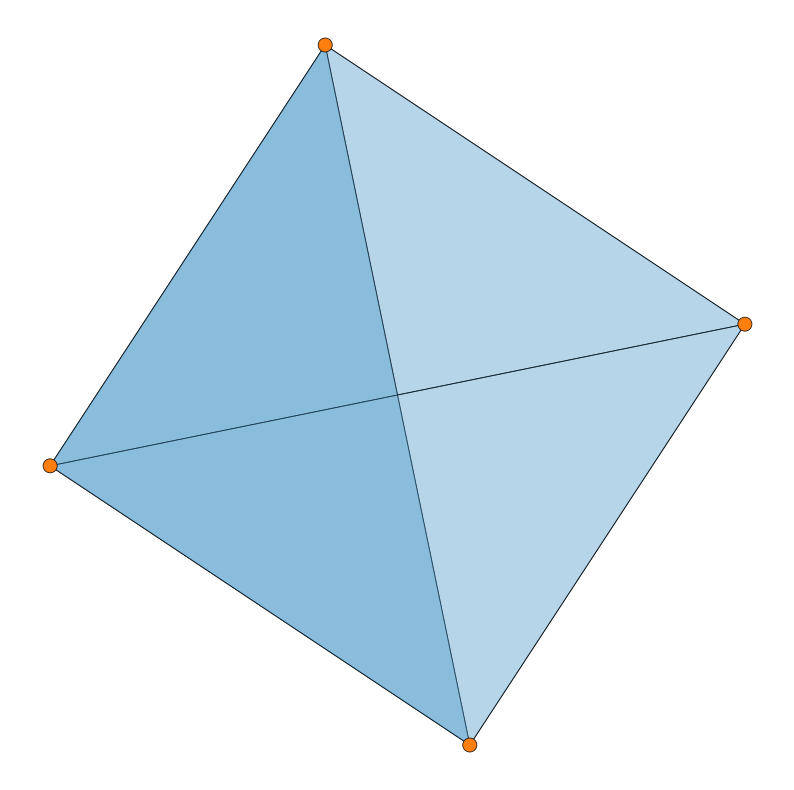

In [10]:
plt.figure(figsize=(10,10))
ax = plt.subplot(111)
draw_2d_simplicial_complex(cX, ax=ax)

In [11]:
cX.f_vector()[1:]

[4, 6, 3]

**Exercise:** Construct the simplicial complex depicted as depicted in the following picture: 

![Example Simplicial Complex](images/simplicial_complex_2.png "Exercise Simplicial Complex")

Use the visulization tool to check your work. 

In [81]:
# Insert Code Here
mySimplicialComplex = SimplicialComplex([[0,1,2],[1,3],[2,4],[2,3]])

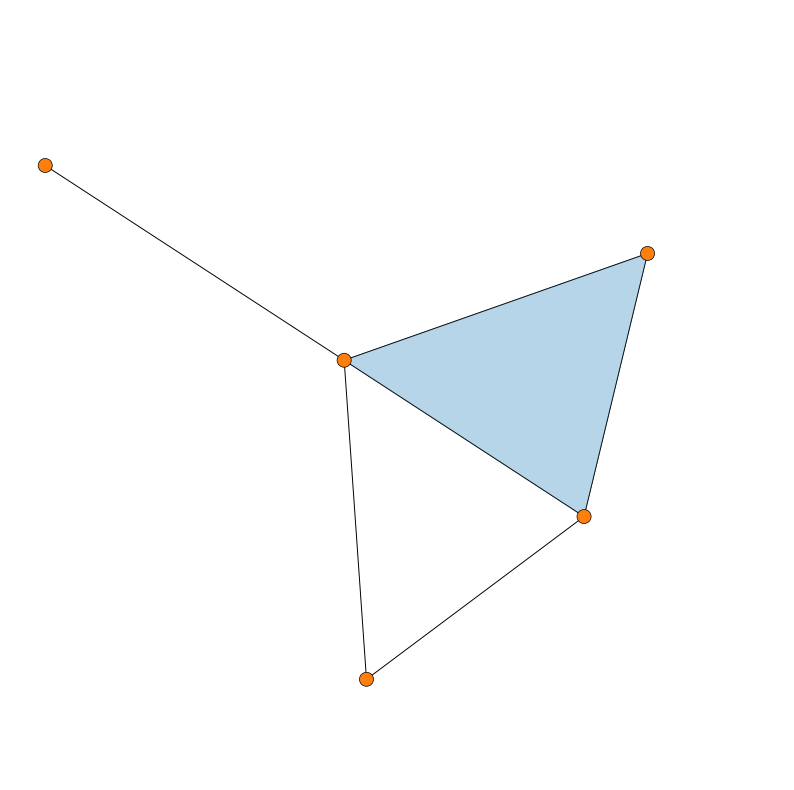

In [82]:
plt.figure(figsize=(10,10))
ax = plt.subplot(111)
draw_2d_simplicial_complex(mySimplicialComplex, ax=ax)

# Cellular Homology, Betti Numbers and Euler Characteristic

**Definition:** Define the boundary operator $\partial_m : \mathbb F^{f_m} \rightarrow \mathbb F^{f_{m - 1}}$ by 
$$\partial_m(\sigma) := \sum_{0 \leq j \leq m} (\sigma - \{ \sigma_{i,j} \})$$

**Definition:** The $i$th $\mathbb F$-**cellular homology group** of $K$ to the vector space over $\mathbb F$ is defined as. 

$$H_i(K, \mathbb F) := \mathbb F^{null(\partial_i) - rank(\partial_{i + 1})}$$

**Definition:** The $i$th $\mathbb F$-**Betti Number** of $K$ is defined to be 
$$\beta_i(K, \mathbb F) := dim(H_i(K, \mathbb F)) = null(\partial_i) - rank(\partial_{i + 1})$$
Some examples of Betti Numbers over $\mathbb F_2:$

![betti](images/betti.png "Betti Numbers of Common Complexes")

**Definition** Let$K$ be an $d$-dimensional simplicial complex, and let $f_i(K)$ denote the number of $i$-simplices of $K$. The Euler characteristic of $K$, denoted $\chi(K)$ is defined by 
$$\chi(𝐾) ∶= \sum_{i = 0}^d (−1)^i f_i(K) = \sum_{i = 0}^d (-1) \beta_i(K)$$

In [13]:
X.homology(base_ring=GF(2), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 2,
 1: Vector space of dimension 1 over Finite Field of size 2}

In [14]:
X.homology(base_ring=GF(3), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 3,
 1: Vector space of dimension 1 over Finite Field of size 3}

In [85]:
X.homology(base_ring=GF(17), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 17,
 1: Vector space of dimension 1 over Finite Field of size 17}

In [15]:
X.homology(reduced=False)

{0: Z, 1: Z}

In [86]:
X.betti()

{0: 1, 1: 1}

In [87]:
X.euler_characteristic()

0

In [18]:
XX.homology(reduced=False)

{0: Z, 1: Z x Z, 2: Z}

In [19]:
XX.betti()

{0: 1, 1: 2, 2: 1}

In [20]:
XX.euler_characteristic()

0

In [21]:
cX.homology(reduced=False)

{0: Z, 1: 0, 2: 0}

In [22]:
cX.betti()

{0: 1, 1: 0, 2: 0}

In [23]:
cX.euler_characteristic()

1

**Exercise:** Calculate the $\mathbb F_2, \mathbb F_3,$ and $\mathbb Z$-coefficient homology groups for the complex you constructed in the first section. 

In [24]:
# Insert Code Here

### Computing Homologies of Familiar Surfaces

#### The Torus
![Torus](images/Mug_and_Torus_morph.gif "Torus")

In [25]:
T = simplicial_complexes.Torus()

In [26]:
T.homology(base_ring=GF(2), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 2,
 1: Vector space of dimension 2 over Finite Field of size 2,
 2: Vector space of dimension 1 over Finite Field of size 2}

In [27]:
T.homology(base_ring=GF(3), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 3,
 1: Vector space of dimension 2 over Finite Field of size 3,
 2: Vector space of dimension 1 over Finite Field of size 3}

In [28]:
T.homology(reduced=False)

{0: Z, 1: Z x Z, 2: Z}

In [29]:
T.betti()

{0: 1, 1: 2, 2: 1}

In [30]:
T.euler_characteristic()

0

#### The Real Projective Plane
![RP2](images/rp2.jpg "Real Projective Plane")

In [31]:
RP2 = simplicial_complexes.ProjectivePlane()

In [32]:
RP2.homology(base_ring=GF(2), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 2,
 1: Vector space of dimension 1 over Finite Field of size 2,
 2: Vector space of dimension 1 over Finite Field of size 2}

In [33]:
RP2.homology(base_ring=GF(3), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 3,
 1: Vector space of dimension 0 over Finite Field of size 3,
 2: Vector space of dimension 0 over Finite Field of size 3}

In [34]:
RP2.homology(reduced=False)

{0: Z, 1: C2, 2: 0}

In [35]:
RP2.betti()

{0: 1, 1: 0, 2: 0}

In [36]:
RP2.euler_characteristic()

1

#### The Sphere
![Sphere](images/Sphere_wireframe_10deg_6r.svg.png "Sphere")

In [37]:
S = simplicial_complexes.RandomTwoSphere(6)

In [38]:
S.homology(base_ring=GF(2), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 2,
 1: Vector space of dimension 0 over Finite Field of size 2,
 2: Vector space of dimension 1 over Finite Field of size 2}

In [39]:
S.homology(base_ring=GF(3), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 3,
 1: Vector space of dimension 0 over Finite Field of size 3,
 2: Vector space of dimension 1 over Finite Field of size 3}

In [40]:
S.homology(reduced=False)

{0: Z, 1: 0, 2: Z}

In [41]:
S.betti()

{0: 1, 1: 0, 2: 1}

In [42]:
S.euler_characteristic()

2

#### The Klein Bottle
![Klein Bottle](images/Klein_bottle_time_evolution_in_xyzt-space.gif "Klein Bottle")

In [43]:
K = simplicial_complexes.KleinBottle()

In [44]:
K.homology(base_ring=GF(2), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 2,
 1: Vector space of dimension 2 over Finite Field of size 2,
 2: Vector space of dimension 1 over Finite Field of size 2}

In [45]:
K.homology(base_ring=GF(3), reduced=False)

{0: Vector space of dimension 1 over Finite Field of size 3,
 1: Vector space of dimension 1 over Finite Field of size 3,
 2: Vector space of dimension 0 over Finite Field of size 3}

In [46]:
K.homology(reduced=False)

{0: Z, 1: Z x C2, 2: 0}

In [47]:
K.betti()

{0: 1, 1: 1, 2: 0}

In [48]:
K.euler_characteristic()

0

### Why do we care about homology? 

**Theorem:** Suppose $K$ is homotopically equivalent to $L$. Then $\beta_i(K) = \beta_i(L)$ for every integer $i \geq 0$.

# Introducing Persistent Homology using Vietoris Rips

### Persistent Homology

**Definition:** A **filtration** of a simplicial complex $K$ is a function $f : K \rightarrow \mathbb R_{\geq 0}$ such that 

$$\forall \tau, \sigma \in K, \tau \subset \sigma \implies f(\tau) \leq f(\sigma)$$

**Note:** This is equivalent to defining a simplicial complex with weights assigned to each simplex

![Persistence_1](images/persistence_1.png "Abstract Persistence Example")

In [49]:
example = gudhi.SimplexTree()
example.insert([0], filtration=0)
example.insert([1], filtration=1)
example.insert([0,1], filtration=1)
example.insert([2], filtration=2)
example.insert([3], filtration=3)
example.insert([2,3], filtration=3)
example.insert([4], filtration=4)
example.insert([3,4], filtration=4)
example.insert([5], filtration=5)
example.insert([4,5], filtration=5)
example.insert([1,2], filtration=6)
example.insert([3,5], filtration=7)
example.insert([3,4,5], filtration=7)
example.insert([6], filtration=8)
example.insert([2,6], filtration=8)
example.insert([3,6], filtration=9)
example.insert([2,5], filtration=10)
example.insert([1,5], filtration=11)
example.insert([1,2,5], filtration=11)
example.insert([2,3,6], filtration=12)

True

We enumerate critical values of the filtration function $f$ as $c_1, \ldots, c_q$. These critical values enumerate points 

$$c_1 = (b_1, d_1)$$
$$c_2 = (b_2, d_2)$$
$$\vdots$$
$$c_j = (b_j, d_j)$$
$$c_{j + 1} = (b_j, \infty)$$
$$\vdots$$
$$c_{q} = (b_q, \infty)$$

These are called **persistence pairs**. Further, the $i$th betti number at time $t$ is equal to 

$$\beta_i(t) = |\{ c_i = (b_i, d_i) \in Crit(f,K) : b_i \leq t < d_i  \}|$$

In [50]:
my_example_persistence = example.persistence(homology_coeff_field = 2)

In [51]:
my_example_persistence

[(1, (10.0, inf)), (1, (9.0, 12.0)), (0, (0.0, inf)), (0, (2.0, 6.0))]

Since these are pairs, we can plot them for the timespan they occupy: 

/opt/anaconda3/envs/apptop/lib/python3.10/site-packages/gudhi/persistence_graphical_tools.py:105: UserWarning:

This function is not available.
ModuleNotFoundError: No module named 'matplotlib'.



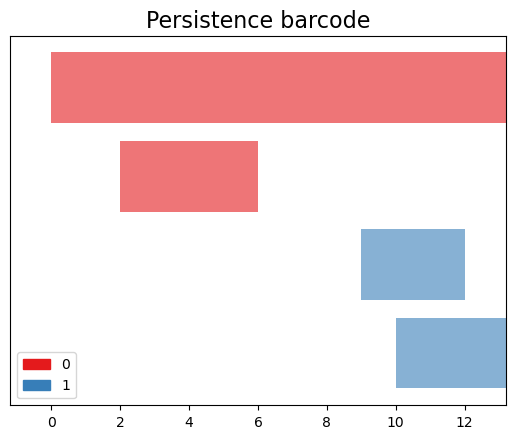

In [52]:
gudhi.plot_persistence_barcode(my_example_persistence, legend=True)
plt.show()

Sometimes it's quite annoying to look a barcode with many bars, so often this is translated into an equivalent representation, called a persistence diagram. Since they are ordered pairs, we can just plot them by birth-death. Further, since we know 
$$d_i \geq b_i \text{ for all persistence pairs} $$
Then it follows that all points will be above the identity line. 

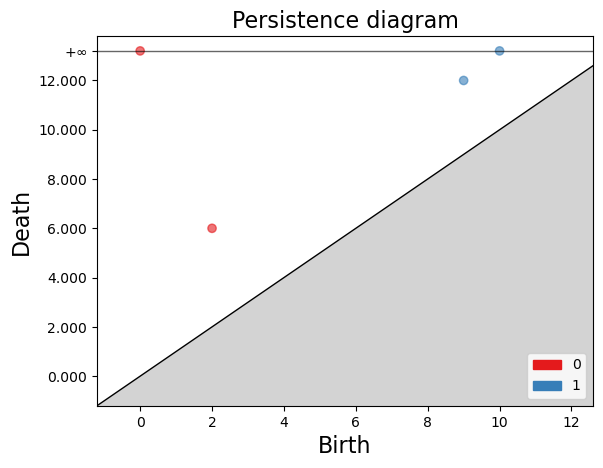

In [53]:
gudhi.plot_persistence_diagram(my_example_persistence, legend=True)
plt.show()

**Exercise:** Calculate the persistence barcode of the following diagram: 
![Persistence_2](images/persistence_2.png "Abstract Persistence Exercise")

In [54]:
# Insert Code Here

### Defining Vietrois-Rips

**Definition:** Given $r > 0$, the **Vietoris-Rips Complex** over the vertex set $P$ is defined as the the complex $K$ such that 

$$\{ v_0, \ldots, v_k \} \in K \iff \| v_i - v_j \|_2 \leq r \text{ for all } i,j \in \{ 0, \ldots, k \}$$

In terms of filtrations, we write: 

$$f(\sigma) := \max_{i,j \in \sigma} \| v_i - v_j \|_2$$

Visually, this looks like the balls expanding upon each point: 

![SegmentLocal](images/vietoris_rips_point_cloud.gif "segment")


### Perform Vietoris Rips on the Sphere

In [108]:
# Adjust these hyperparameters
n = 100
R = 1.7

In [109]:
b = 3
perturb = 10
D = 3

def parametrized_sphere(u,v):
    
    return b * math.cos(u)*math.sin(v) + b / perturb * np.random.normal(), b * math.sin(u)*math.sin(v) + b / perturb * np.random.normal(), b * math.cos(v) + b / perturb * np.random.normal()

zfunc = np.vectorize(parametrized_sphere)

In [110]:
Theta = 2 * math.pi * np.random.rand(n)
Phi = 2 * math.pi * (np.random.rand(n) - 0.5)
X, Y, Z = zfunc(Theta, Phi)

In [111]:
things_to_plot = []

things_to_plot.append(
        go.Scatter3d(x=X, y=Y, z=Z,
            mode='markers',
            marker=dict(
                size=5,
                color=X,                # set color to an array/list of desired values
                colorscale=px.colors.qualitative.Dark24,   # choose a colorscale
                opacity=1
                ), 
            hoverinfo='none',
            showlegend=False)
    )

layout = go.Layout(autosize=False, width=900, height=900, showlegend = False, scene=dict(
                 aspectmode='data'
         ))
fig = go.Figure(data = things_to_plot, layout = layout)
iplot(fig)

In [112]:
S = np.stack((X,Y,Z)).T

In [113]:
VR_cplx = VietorisRips(S, max_dimension = 3, max_radius = R)

Evaluating Dimension 1


100%|███████████████████████████████████████████████| 10000/10000 [00:00<00:00, 85146.94it/s]


	Number of Connected Components:  1
Estimating Number of Facets for dimension  2 Part 1:


100%|████████████████████████████████████████████████| 1002/1002 [00:00<00:00, 872108.86it/s]


Estimating Number of Facets for dimension  2 Part 2:


100%|███████████████████████████████████████████████████| 100/100 [00:00<00:00, 15246.47it/s]


Evaluating Dimension 2


100%|████████████████████████████████████████████████| 4160/4160 [00:00<00:00, 440725.05it/s]


Estimating Number of Facets for dimension  3 Part 1:


100%|███████████████████████████████████████████████| 4160/4160 [00:00<00:00, 1586642.23it/s]


Estimating Number of Facets for dimension  3 Part 2:


100%|█████████████████████████████████████████████████| 4160/4160 [00:00<00:00, 18777.65it/s]


Evaluating Dimension 3


100%|████████████████████████████████████████████| 114322/114322 [00:00<00:00, 377260.59it/s]


In [114]:
example2 = gudhi.SimplexTree()
filtration = []
for d in range(D + 1):
    for facet, val in VR_cplx[d]:
        filtration.append((facet, val))
        example2.insert(facet, filtration=val)

In [115]:
my_persistence = example2.persistence(homology_coeff_field = 2)

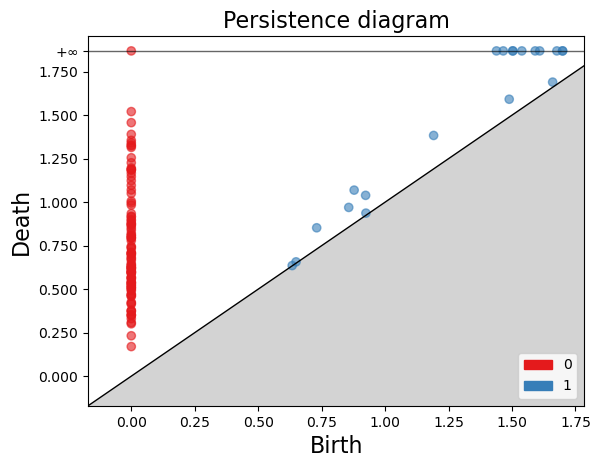

In [116]:
gudhi.plot_persistence_diagram(my_persistence, legend=True)
plt.show()

In [117]:
betti_numbers = {}
for i in range(D + 1):
    betti_numbers[i] = 0
for bar, bd in my_persistence:
    if bd[1] > R: 
        betti_numbers[bar] += 1

print("Betti Numbers up to Dimension",D," over the field F_2")
print(betti_numbers)

Betti Numbers up to Dimension 3  over the field F_2
{0: 1, 1: 10, 2: 0, 3: 0}


In [118]:
draw_geometric_simplcial_complex(VR_cplx, S, draw_points = True, draw_edges = True, draw_surfaces = True)

**Exercise:** Adjust the hyperparameters listed in order to get the correct Betti Numbers

### Perform Vietoris Rips on the Torus

In [66]:
# Adjust these hyperparameters
n = 2000
R = 1

In [67]:
D = 3
a = 5
b = 2
perturb = 5

def parametrized_torus(theta,phi):
    
    return ((a + b * math.cos(theta)) * math.cos(phi) + b / perturb * np.random.normal(), (a + b * math.cos(theta)) * math.sin(phi) + b / perturb * np.random.normal(), b * math.sin(theta) + b / perturb * np.random.normal())

zfunc = np.vectorize(parametrized_torus)

In [68]:
Theta = 2 * math.pi * np.random.rand(n)
Phi = 2 * math.pi * (np.random.rand(n) - 0.5)
X, Y, Z = zfunc(Theta, Phi)

In [69]:
things_to_plot = []

things_to_plot.append(
        go.Scatter3d(x=X, y=Y, z=Z,
            mode='markers',
            marker=dict(
                size=5,
                color=X,                # set color to an array/list of desired values
                colorscale=px.colors.qualitative.Dark24,   # choose a colorscale
                opacity=1
                ), 
            hoverinfo='none',
            showlegend=False)
    )

layout = go.Layout(autosize=False, width=900, height=900, showlegend = False, scene=dict(
                 aspectmode='data'
         ))
fig = go.Figure(data = things_to_plot, layout = layout)
iplot(fig)

In [70]:
S = np.stack((X,Y,Z)).T

In [71]:
VR_cplx = VietorisRips(S, max_dimension = D, max_radius = R)

Evaluating Dimension 1


100%|██████████████████████████████████████████| 4000000/4000000 [00:38<00:00, 104516.33it/s]


	Number of Connected Components:  4
Estimating Number of Facets for dimension  2 Part 1:


100%|█████████████████████████████████████████████| 27478/27478 [00:00<00:00, 2120535.15it/s]


Estimating Number of Facets for dimension  2 Part 2:


100%|██████████████████████████████████████████████████| 2000/2000 [00:00<00:00, 7763.92it/s]


Evaluating Dimension 2


100%|████████████████████████████████████████████| 124571/124571 [00:00<00:00, 436881.31it/s]


Estimating Number of Facets for dimension  3 Part 1:


100%|███████████████████████████████████████████| 124571/124571 [00:00<00:00, 1564918.24it/s]


Estimating Number of Facets for dimension  3 Part 2:


100%|█████████████████████████████████████████████| 124571/124571 [00:08<00:00, 14219.39it/s]


Evaluating Dimension 3


100%|██████████████████████████████████████████| 3185632/3185632 [00:09<00:00, 348775.27it/s]


In [72]:
example2 = gudhi.SimplexTree()
filtration = []
for d in range(D + 1):
    for facet, val in VR_cplx[d]:
        filtration.append((facet, val))
        example2.insert(facet, filtration=val)

In [73]:
my_persistence = example2.persistence(homology_coeff_field = 2)

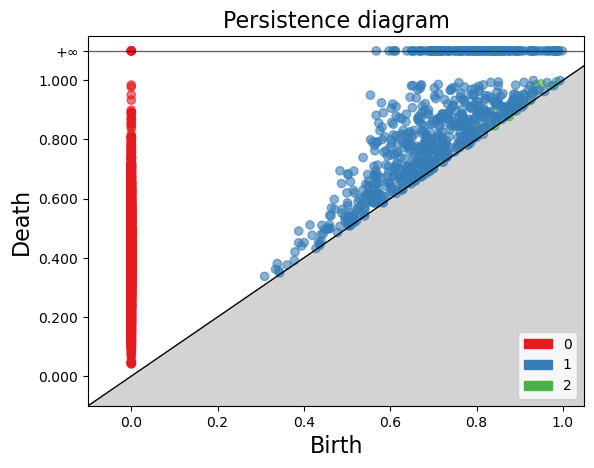

In [74]:
gudhi.plot_persistence_diagram(my_persistence, legend=True)
plt.show()

In [75]:
betti_numbers = {}
for i in range(D + 1):
    betti_numbers[i] = 0
for bar, bd in my_persistence:
    if bd[1] > R: 
        betti_numbers[bar] += 1

print("Betti Numbers up to Dimension",D," over the field F_2")
print(betti_numbers)

Betti Numbers up to Dimension 3  over the field F_2
{0: 4, 1: 152, 2: 2, 3: 0}


In [76]:
draw_geometric_simplcial_complex(VR_cplx, S, draw_points = True, draw_edges = True, draw_surfaces = True)

**Exercise:** Adjust the hyperparameters listed in order to get the correct Betti Numbers (or reasonably close)

### Drawbacks of Vietoris Rips

0. Doesn't make use of features beyond 1-skeleton!
1. Computationally inefficient as the number of vertices grows! 
2. There is no clearly defined maximum radius of consideration!
3. Certain homological features are not guarenteed to persist infinitely! 

### Positives of Vietoris Rips

It's so bad that there's a many veins of research! Some to improve the computational efficiency to calculate VRips. Some to build more interesting filtrations (what I do). 

# The End

Now you get to move on the final module: Defining More Sophisticated Filtrations for the Future! 